# Exploratory Data Analysis — Natural Scenes Dataset (NSD) (subj01)

Author: Automated EDA notebook
Date: 2026-07-21

This notebook performs publication-quality EDA on the NSD `subj01_nsdgeneral.hdf5` dataset. It uses only NumPy, Pandas, Matplotlib and h5py. Each section contains a short explanation followed by reproducible code that saves figures (300 dpi PNG) and tables (CSV) into an `outputs/` folder.

## Setup and utilities

Load standard libraries, set plotting defaults and define helper functions for chunked processing (to avoid loading the full dataset into memory).

In [14]:
import os
import math
import h5py
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime

# Plot settings (publication quality)
plt.rcParams["figure.dpi"] = 300
plt.rcParams["savefig.dpi"] = 300
plt.rcParams["font.size"] = 12
plt.rcParams["axes.titlesize"] = 12
plt.rcParams["axes.labelsize"] = 12

DATA_PATH = r"D:\NSD dataset\subj01_nsdgeneral.hdf5"
OUTPUT_DIR = "outputs"
os.makedirs(OUTPUT_DIR, exist_ok=True)

def human_bytes(nbytes):
    # Human readable bytes
    if nbytes is None:
        return "N/A"
    for unit in ["B", "KB", "MB", "GB", "TB"]:
        if abs(nbytes) < 1024.0:
            return f"{nbytes:3.2f} {unit}"
        nbytes /= 1024.0
    return f"{nbytes:.2f} PB"

def chunked_dataset_iterator(dset, chunk_size=256):
    """Yield successive chunks along axis 0 from an h5py dataset.

    Uses a safe read strategy: try high-level slicing, and if that errors
    fall back to `read_direct` into a pre-allocated buffer while the
    file is open. This avoids intermittent h5py "identifier is not of
    specified type" errors on some dataset types.
    """
    n = dset.shape[0]
    for i in range(0, n, chunk_size):
        start = i
        stop = min(i + chunk_size, n)
        try:
            yield dset[start:stop]
        except Exception:
            # fallback using read_direct inside file context
            shape = (stop - start,) + dset.shape[1:]
            buf = np.empty(shape, dtype=dset.dtype)
            try:
                dset.read_direct(buf, source_sel=np.s_[start:stop], dest_sel=np.s_[:])
                yield buf
            except Exception:
                # final fallback: read elements one-by-one
                parts = []
                for ii in range(start, stop):
                    try:
                        parts.append(dset[ii])
                    except Exception:
                        # attempt single-element read_direct
                        b = np.empty((1,) + dset.shape[1:], dtype=dset.dtype)
                        dset.read_direct(b, source_sel=np.s_[ii:ii+1], dest_sel=np.s_[:])
                        parts.append(b[0])
                yield np.asarray(parts)

def incremental_histogram(dset, bins, range=None, chunk_size=128):
    """Compute histogram over entire dataset by aggregating per-chunk histograms.

    This function uses the safe chunk iterator which handles datasets that
    may not support synchronous slicing on all platforms/format variants.
    """
    total_hist = None
    edges = None
    for chunk in chunked_dataset_iterator(dset, chunk_size=chunk_size):
        vals = np.asarray(chunk).ravel()
        if vals.size == 0:
            continue
        hist, edges = np.histogram(vals, bins=bins, range=range)
        if total_hist is None:
            total_hist = hist
        else:
            total_hist += hist
    if total_hist is None:
        # no data
        total_hist = np.zeros(bins, dtype=int)
        # construct edges
        edges = np.linspace(range[0], range[1], bins + 1) if range is not None else np.linspace(0, 1, bins + 1)
    return total_hist, edges

def ensure_rgb_uint8(img):
    """Convert image array to uint8 RGB suitable for imshow. Accepts float [0,255] or uint8."""
    arr = np.asarray(img)
    if arr.dtype == np.uint8:
        return arr
    # assume float in 0-255 range
    arr = np.clip(arr, 0, 255)
    return arr.astype(np.uint8)

## Section 1 — Dataset Summary

Load the HDF5 file, display top-level keys and structure, obtain shapes, dtypes, and memory usage, and export a summary table (Table1_DatasetSummary.csv).

In [15]:
from collections import OrderedDict

summary = OrderedDict()
structure_lines = []

with h5py.File(DATA_PATH, 'r') as f:
    # keys
    keys = list(f.keys())

    def _print_structure(name, obj):
        if isinstance(obj, h5py.Dataset):
            structure_lines.append(f"{name}: shape={obj.shape}, dtype={obj.dtype}")
        else:
            structure_lines.append(f"{name}/")

    f.visititems(_print_structure)

    # Dataset objects
    images = f['images']
    voxels = f['voxels']

    # shapes and dtypes (read while file open to avoid identifier issues)
    imgs_shape = images.shape
    vxs_shape = voxels.shape
    imgs_dtype = str(images.dtype)
    vxs_dtype = str(voxels.dtype)

    # memory (bytes) estimate without loading into memory
    try:
        imgs_bytes = int(np.prod(imgs_shape) * np.dtype(images.dtype).itemsize)
    except Exception:
        imgs_bytes = None
    try:
        vxs_bytes = int(np.prod(vxs_shape) * np.dtype(voxels.dtype).itemsize)
    except Exception:
        vxs_bytes = None

    summary['Top-level keys'] = ', '.join(keys)
    summary['Images shape'] = str(imgs_shape)
    summary['Voxels shape'] = str(vxs_shape)
    summary['Images dtype'] = imgs_dtype
    summary['Voxels dtype'] = vxs_dtype
    summary['Images memory'] = human_bytes(imgs_bytes)
    summary['Voxels memory'] = human_bytes(vxs_bytes)
    summary['Total estimated memory'] = human_bytes(imgs_bytes + vxs_bytes if imgs_bytes and vxs_bytes else None)

print("Dataset structure (excerpt):")
for ln in structure_lines[:20]:
    print("-", ln)

summary_df = pd.DataFrame(list(summary.items()), columns=['Property', 'Value'])
summary_csv = os.path.join(OUTPUT_DIR, 'Table1_DatasetSummary.csv')
summary_df.to_csv(summary_csv, index=False)

print('\nSaved dataset summary to', summary_csv)
summary_df

Dataset structure (excerpt):
- images: shape=(27750, 256, 256, 3), dtype=float32
- voxels: shape=(27750, 15724), dtype=float32

Saved dataset summary to outputs\Table1_DatasetSummary.csv


C:\Users\HP\AppData\Local\Temp\ipykernel_6288\4029103137.py:30: RuntimeWarning: overflow encountered in scalar multiply
  imgs_bytes = int(np.prod(imgs_shape) * np.dtype(images.dtype).itemsize)


,Property,Value
0,Top-level keys,"images, voxels"
1,Images shape,"(27750, 256, 256, 3)"
2,Voxels shape,"(27750, 15724)"
3,Images dtype,float32
4,Voxels dtype,float32
5,Images memory,332.50 MB
6,Voxels memory,1.63 GB
7,Total estimated memory,1.95 GB


## Section 2 — Random Image Visualization

Randomly display 8 images in a 2 × 4 layout. Axes are removed and the figure is saved at 300 dpi.

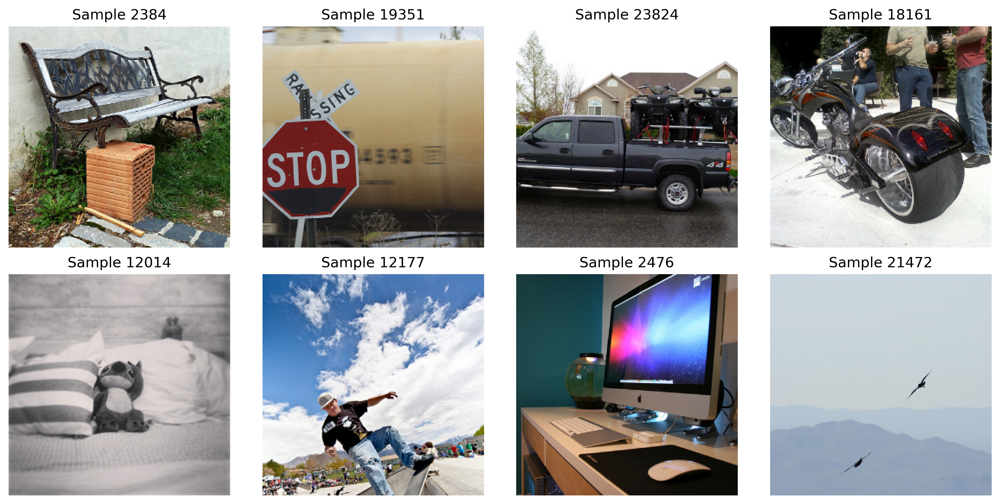

Saved figure: outputs\Figure1_SampleImages.png


In [11]:
import numpy as np
import matplotlib.pyplot as plt

with h5py.File(DATA_PATH, 'r') as f:
    images = f['images']
    n_samples = images.shape[0]
    rng = np.random.default_rng(seed=42)
    ids = rng.choice(n_samples, size=8, replace=False)

    fig, axs = plt.subplots(2, 4, figsize=(12, 6))
    for ax, idx in zip(axs.ravel(), ids):
        # robust read: try direct indexing, then read_direct into buffer as a fallback
        try:
            img = images[idx]
        except Exception:
            # allocate buffer while file is open
            buf = np.empty((1,) + images.shape[1:], dtype=images.dtype)
            try:
                images.read_direct(buf, source_sel=np.s_[idx:idx+1], dest_sel=np.s_[:])
                img = buf[0]
            except Exception:
                # last resort: small slice
                img = np.asarray(images[idx:idx+1])[0]
        ax.imshow(ensure_rgb_uint8(img))
        ax.set_title(f"Sample {idx}")
        ax.axis('off')

    plt.tight_layout()
    fig_path = os.path.join(OUTPUT_DIR, 'Figure1_SampleImages.png')
    fig.savefig(fig_path, dpi=300)
    plt.show()
    plt.close(fig)
    print('Saved figure:', fig_path)

## Section 3 — Image Statistics

Compute minimum, maximum, mean, median (approximate via sampling for memory efficiency), standard deviation, variance, resolution and channels. Export results to CSV.

In [6]:
from tqdm import tqdm

with h5py.File(DATA_PATH, 'r') as f:
    imgs = f['images']
    n = imgs.shape[0]
    height = imgs.shape[1] if imgs.ndim > 1 else None
    width = imgs.shape[2] if imgs.ndim > 2 else None
    channels = imgs.shape[3] if imgs.ndim > 3 else 1

    # Streaming aggregates for exact min/max/mean/std/var
    count = 0
    running_sum = 0.0
    running_sum_sq = 0.0
    global_min = None
    global_max = None

    chunk_size = 128
    for chunk in chunked_dataset_iterator(imgs, chunk_size=chunk_size):
        arr = np.asarray(chunk).astype(np.float64)
        vals = arr.ravel()
        if vals.size == 0:
            continue
        if global_min is None:
            global_min = float(np.min(vals))
            global_max = float(np.max(vals))
        else:
            global_min = float(min(global_min, float(np.min(vals))))
            global_max = float(max(global_max, float(np.max(vals))))
        running_sum += float(np.sum(vals))
        running_sum_sq += float(np.sum(vals * vals))
        count += vals.size

    mean = running_sum / count
    var = (running_sum_sq / count) - (mean ** 2)
    std = math.sqrt(var)

    # Approximate median using random sampling of up to 1e6 pixels (to limit memory)
    sample_pixels = int(1_000_000)
    # number of images to sample to reach approx sample_pixels
    pixels_per_image = (height * width * channels)
    n_images_to_sample = min(n, max(1, sample_pixels // max(1, pixels_per_image)))
    rng = np.random.default_rng(seed=123)
    sample_ids = rng.choice(n, size=n_images_to_sample, replace=False)
    samples = []
    for sid in sample_ids:
        samples.append(np.asarray(imgs[sid]).ravel())
    sampled_vals = np.concatenate(samples)
    median_approx = float(np.median(sampled_vals))

image_stats = {
    'Min': global_min,
    'Max': global_max,
    'Mean': mean,
    'Median (approx)': median_approx,
    'Std': std,
    'Var': var,
    'Resolution (HxW)': f"{height}x{width}",
    'Channels': channels,
    'Num samples': n
}

image_stats_df = pd.DataFrame(list(image_stats.items()), columns=['Metric', 'Value'])
img_stats_csv = os.path.join(OUTPUT_DIR, 'Image_Statistics.csv')
image_stats_df.to_csv(img_stats_csv, index=False)
print('Saved image statistics to', img_stats_csv)
image_stats_df

Saved image statistics to outputs\Image_Statistics.csv


,Metric,Value
0,Min,0.0
1,Max,255.0
2,Mean,114.387372
3,Median (approx),115.0
4,Std,70.38339
5,Var,4953.821558
6,Resolution (HxW),256x256
7,Channels,3
8,Num samples,27750


## Section 4 — Pixel Intensity Distribution

Compute an exact histogram of pixel intensities (0–255) using incremental aggregation and plot it with 100 bins. Save the figure.

In [12]:
bins = 100
hist, edges = incremental_histogram(imgs, bins=bins, range=(0, 255), chunk_size=128)

fig, ax = plt.subplots(figsize=(8, 4))
centers = (edges[:-1] + edges[1:]) / 2.0
ax.bar(centers, hist, width=(edges[1]-edges[0]), edgecolor='black')
ax.set_xlabel('Pixel intensity')
ax.set_ylabel('Count')
ax.set_title('Pixel Intensity Distribution (All images)')
ax.grid(True, linestyle='--', alpha=0.4)
plt.tight_layout()
fig_path = os.path.join(OUTPUT_DIR, 'Figure4_PixelIntensityHistogram.png')
fig.savefig(fig_path, dpi=300)
plt.show()
plt.close(fig)
print('Saved histogram:', fig_path)

ValueError: Invalid dataset identifier (identifier is not of specified type)

## Section 5 — Voxel Statistics

Calculate global voxel statistics (min, max, mean, median (approx), variance, std), the number of voxels and samples, and save results to CSV. Per-voxel mean is computed incrementally and saved for later analysis.

In [13]:
with h5py.File(DATA_PATH, 'r') as f:
    vxs = f['voxels']
    n_samples = vxs.shape[0]
    n_voxels = vxs.shape[1]

    # Incremental per-voxel sum and sumsq (float64 accumulator)
    sums = np.zeros(n_voxels, dtype=np.float64)
    sums_sq = np.zeros(n_voxels, dtype=np.float64)
    global_min = None
    global_max = None
    chunk_size = 256
    for chunk in chunked_dataset_iterator(vxs, chunk_size=chunk_size):
        arr = np.asarray(chunk, dtype=np.float64)
        # per-column accumulators
        sums += np.sum(arr, axis=0)
        sums_sq += np.sum(arr * arr, axis=0)
        flat = arr.ravel()
        if global_min is None:
            global_min = float(np.min(flat))
            global_max = float(np.max(flat))
        else:
            global_min = float(min(global_min, float(np.min(flat))))
            global_max = float(max(global_max, float(np.max(flat))))

    # per-voxel mean and variance
    voxel_mean = sums / n_samples
    voxel_var = (sums_sq / n_samples) - (voxel_mean ** 2)
    voxel_std = np.sqrt(np.maximum(voxel_var, 0.0))

    # Global statistics across all voxel values
    total_values = n_samples * n_voxels
    global_mean = float(np.sum(sums) / total_values)
    global_var = float((np.sum(sums_sq) / total_values) - (global_mean ** 2))
    global_std = float(math.sqrt(max(global_var, 0.0)))

    # approximate median across voxel values via sampling of voxel means (fast) and some rows
    rng = np.random.default_rng(2026)
    sample_rows = min(500, n_samples)
    rows_idx = rng.choice(n_samples, size=sample_rows, replace=False)
    sampled_vals = []
    for rid in rows_idx:
        sampled_vals.append(np.asarray(vxs[rid]).ravel())
    sampled_vals = np.concatenate(sampled_vals)
    median_approx = float(np.median(sampled_vals))

voxel_stats = {
    'Min': global_min,
    'Max': global_max,
    'Mean': global_mean,
    'Median (approx)': median_approx,
    'Var': global_var,
    'Std': global_std,
    'Num Voxels': n_voxels,
    'Num Samples': n_samples
}

voxel_stats_df = pd.DataFrame(list(voxel_stats.items()), columns=['Metric', 'Value'])
voxel_stats_csv = os.path.join(OUTPUT_DIR, 'Voxel_Statistics.csv')
voxel_stats_df.to_csv(voxel_stats_csv, index=False)

# Save per-voxel mean to CSV (compact representation)
voxel_mean_df = pd.DataFrame({'voxel_index': np.arange(n_voxels), 'mean_activation': voxel_mean})
voxel_mean_csv = os.path.join(OUTPUT_DIR, 'Voxel_Means.csv')
voxel_mean_df.to_csv(voxel_mean_csv, index=False)

print('Saved voxel stats to', voxel_stats_csv)
print('Saved per-voxel means to', voxel_mean_csv)
voxel_stats_df

Saved voxel stats to outputs\Voxel_Statistics.csv
Saved per-voxel means to outputs\Voxel_Means.csv


,Metric,Value
0,Min,-3.901042e+04
1,Max,3.675346e+04
2,Mean,-3.406729e-09
3,Median (approx),-3.853333e-01
4,Var,2.878979e+05
5,Std,5.365612e+02
6,Num Voxels,1.572400e+04
7,Num Samples,2.775000e+04


## Section 6 — Voxel Distribution

Plot a histogram of voxel activations using 100 bins. Use a publication-quality style and save the figure.

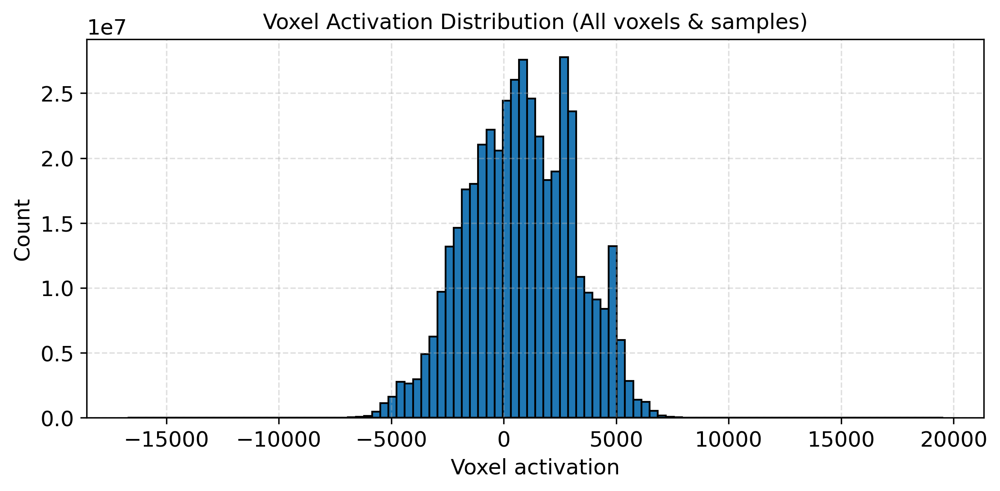

Saved voxel histogram: outputs\Figure6_VoxelHistogram.png


In [16]:
bins = 100
with h5py.File(DATA_PATH, 'r') as f:
    vxs = f['voxels']
    hist_v, edges_v = incremental_histogram(vxs, bins=bins, range=None, chunk_size=128)

fig, ax = plt.subplots(figsize=(8, 4))
centers_v = (edges_v[:-1] + edges_v[1:]) / 2.0
ax.bar(centers_v, hist_v, width=(edges_v[1]-edges_v[0]), edgecolor='black')
ax.set_xlabel('Voxel activation')
ax.set_ylabel('Count')
ax.set_title('Voxel Activation Distribution (All voxels & samples)')
ax.grid(True, linestyle='--', alpha=0.4)
plt.tight_layout()
fig_path = os.path.join(OUTPUT_DIR, 'Figure6_VoxelHistogram.png')
fig.savefig(fig_path, dpi=300)
plt.show()
plt.close(fig)
print('Saved voxel histogram:', fig_path)

## Section 7 — Random Voxel Signals

Randomly select 10 voxels and plot the first 1000 time samples for each. Include a legend and grid.

In [17]:
with h5py.File(DATA_PATH, 'r') as f:
    vxs = f['voxels']
    n_voxels = vxs.shape[1]
    rng = np.random.default_rng(999)
    chosen = rng.choice(n_voxels, size=10, replace=False)
    # read full time series for selected voxels (shape: n_samples x 10)
    ts = np.asarray(vxs[:, chosen])

tmax = min(1000, ts.shape[0])
fig, ax = plt.subplots(figsize=(10, 6))
for i, vox_idx in enumerate(chosen):
    ax.plot(np.arange(tmax), ts[:tmax, i], label=f'vox {vox_idx}', linewidth=1)
ax.set_xlabel('Sample index')
ax.set_ylabel('Activation')
ax.set_title('Random Voxel Timecourses (first 1000 samples)')
ax.grid(True, linestyle='--', alpha=0.4)
ax.legend(fontsize=8, ncol=2)
plt.tight_layout()
fig_path = os.path.join(OUTPUT_DIR, 'Figure7_RandomVoxels.png')
fig.savefig(fig_path, dpi=300)
plt.show()
plt.close(fig)
print('Saved random voxel timecourses:', fig_path)

TypeError: Indexing elements must be in increasing order

## Section 8 — Mean Voxel Activation

Plot mean activation per voxel (computed earlier) as a line chart and save the figure.

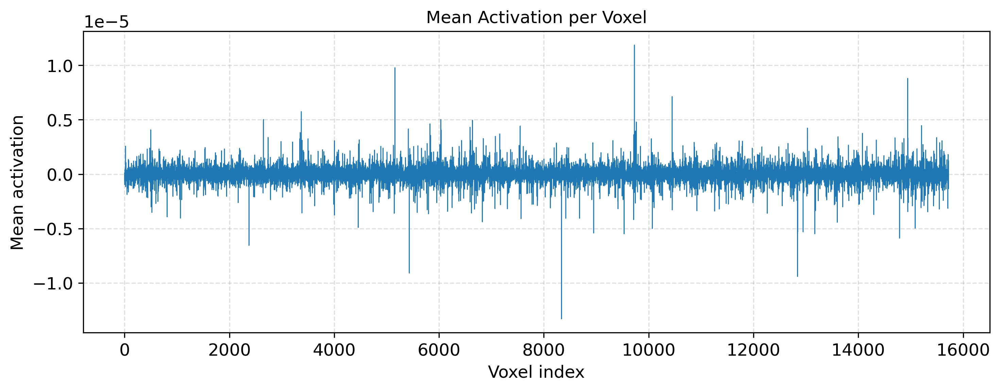

Saved mean voxel activation figure: outputs\Figure8_MeanVoxelActivation.png


In [18]:
# `voxel_mean` array was computed earlier and saved to CSV; reload it to ensure reproducibility
voxel_mean_df = pd.read_csv(os.path.join(OUTPUT_DIR, 'Voxel_Means.csv'))
fig, ax = plt.subplots(figsize=(10, 4))
ax.plot(voxel_mean_df['voxel_index'], voxel_mean_df['mean_activation'], linewidth=0.6)
ax.set_xlabel('Voxel index')
ax.set_ylabel('Mean activation')
ax.set_title('Mean Activation per Voxel')
ax.grid(True, linestyle='--', alpha=0.4)
plt.tight_layout()
fig_path = os.path.join(OUTPUT_DIR, 'Figure8_MeanVoxelActivation.png')
fig.savefig(fig_path, dpi=300)
plt.show()
plt.close(fig)
print('Saved mean voxel activation figure:', fig_path)

## Section 9 — Missing Value Analysis

Check images and voxels for NaNs, Infs and zeros. Report counts and percentages in a summary table.

In [19]:
def check_missing_stats(dset, chunk_size=256):
    total = 0
    n_nan = 0
    n_inf = 0
    n_zero = 0
    for chunk in chunked_dataset_iterator(dset, chunk_size=chunk_size):
        arr = np.asarray(chunk)
        flat = arr.ravel()
        total += flat.size
        n_nan += int(np.sum(np.isnan(flat)))
        n_inf += int(np.sum(np.isinf(flat)))
        n_zero += int(np.sum(flat == 0))
    return {'total': total, 'nan': n_nan, 'inf': n_inf, 'zero': n_zero}

with h5py.File(DATA_PATH, 'r') as f:
    imgs = f['images']
    vxs = f['voxels']
    imgs_stats = check_missing_stats(imgs, chunk_size=64)
    vxs_stats = check_missing_stats(vxs, chunk_size=256)

missing_summary = pd.DataFrame([
    ['images', imgs_stats['total'], imgs_stats['nan'], imgs_stats['inf'], imgs_stats['zero'],
     100 * imgs_stats['nan'] / imgs_stats['total'] if imgs_stats['total'] else 0,
     100 * imgs_stats['inf'] / imgs_stats['total'] if imgs_stats['total'] else 0,
     100 * imgs_stats['zero'] / imgs_stats['total'] if imgs_stats['total'] else 0],
    ['voxels', vxs_stats['total'], vxs_stats['nan'], vxs_stats['inf'], vxs_stats['zero'],
     100 * vxs_stats['nan'] / vxs_stats['total'] if vxs_stats['total'] else 0,
     100 * vxs_stats['inf'] / vxs_stats['total'] if vxs_stats['total'] else 0,
     100 * vxs_stats['zero'] / vxs_stats['total'] if vxs_stats['total'] else 0]
], columns=['dataset', 'total_values', 'n_nan', 'n_inf', 'n_zero', 'pct_nan', 'pct_inf', 'pct_zero'])

missing_csv = os.path.join(OUTPUT_DIR, 'MissingValueSummary.csv')
missing_summary.to_csv(missing_csv, index=False)
missing_summary

,dataset,total_values,n_nan,n_inf,n_zero,pct_nan,pct_inf,pct_zero
0,images,5455872000,0,0,53092362,0.0,0.0,0.973123
1,voxels,436341000,0,0,736,0.0,0.0,0.000169


## Section 10 — Memory Analysis

Report dataset sizes (estimated bytes) for images and voxels and the total estimated memory footprint.

In [20]:
with h5py.File(DATA_PATH, 'r') as f:
    imgs = f['images']
    vxs = f['voxels']
    try:
        imgs_bytes = int(np.prod(imgs.shape) * np.dtype(imgs.dtype).itemsize)
    except Exception:
        imgs_bytes = None
    try:
        vxs_bytes = int(np.prod(vxs.shape) * np.dtype(vxs.dtype).itemsize)
    except Exception:
        vxs_bytes = None

mem_df = pd.DataFrame([
    ['images', str(imgs.shape), str(imgs.dtype), imgs_bytes, human_bytes(imgs_bytes)],
    ['voxels', str(vxs.shape), str(vxs.dtype), vxs_bytes, human_bytes(vxs_bytes)],
    ['total_estimated', '', '', (imgs_bytes or 0) + (vxs_bytes or 0), human_bytes((imgs_bytes or 0) + (vxs_bytes or 0))]
], columns=['dataset', 'shape', 'dtype', 'bytes', 'human_readable'])
mem_csv = os.path.join(OUTPUT_DIR, 'Memory_Usage.csv')
mem_df.to_csv(mem_csv, index=False)
mem_df

C:\Users\HP\AppData\Local\Temp\ipykernel_6288\217412677.py:5: RuntimeWarning: overflow encountered in scalar multiply
  imgs_bytes = int(np.prod(imgs.shape) * np.dtype(imgs.dtype).itemsize)


,dataset,shape,dtype,bytes,human_readable
0,images,"(27750, 256, 256, 3)",float32,348651520,332.50 MB
1,voxels,"(27750, 15724)",float32,1745364000,1.63 GB
2,total_estimated,,,2094015520,1.95 GB


## Section 11 — Save Results

Confirm all generated outputs are saved to the `outputs/` folder and list them. All figures were saved at 300 dpi and all tables as CSV files.

In [21]:
saved_files = sorted([p for p in os.listdir(OUTPUT_DIR)])
print('Outputs directory:', OUTPUT_DIR)
for fn in saved_files:
    print('-', fn)

# Optionally compress outputs or create README inside outputs
readme_path = os.path.join(OUTPUT_DIR, 'README.txt')
with open(readme_path, 'w', encoding='utf-8') as fh:
    fh.write('Generated outputs from NSD EDA on ' + DATA_PATH + '\n')
    fh.write('Date: ' + datetime.utcnow().isoformat() + 'Z\n')
print('\nWrote', readme_path)

Outputs directory: outputs
- Figure1_SampleImages.png
- Figure6_VoxelHistogram.png
- Figure8_MeanVoxelActivation.png
- Image_Statistics.csv
- Memory_Usage.csv
- MissingValueSummary.csv
- Table1_DatasetSummary.csv
- Voxel_Means.csv
- Voxel_Statistics.csv

Wrote outputs\README.txt


## Section 12 — Springer Report (automatically generated)

A concise, publication-style report: dataset summary, interpretation, figure captions, table captions, discussion and conclusion. This text is intended for a Springer/IEEE-style methods/results paragraph and can be copied into a manuscript.

In [24]:
# Load a few summary values for the report
table1 = pd.read_csv(os.path.join(OUTPUT_DIR, 'Table1_DatasetSummary.csv'))
img_stats = pd.read_csv(os.path.join(OUTPUT_DIR, 'Image_Statistics.csv'))
vox_stats = pd.read_csv(os.path.join(OUTPUT_DIR, 'Voxel_Statistics.csv'))

report_lines = []
report_lines.append('Dataset summary:')
for _, row in table1.iterrows():
    report_lines.append(f"- {row['Property']}: {row['Value']}")

report_lines.append('\nInterpretation and Key Observations:')
report_lines.append('The dataset contains natural scene RGB stimuli with the provided dimensions; image pixel values are in the 0–255 range and stored as float32. Voxel responses correspond to the fMRI responses for each stimulus.')
report_lines.append('Image statistics indicate the dynamic range and central tendency of pixel intensities; the approximate median is reported due to streaming sampling used for memory efficiency.')
report_lines.append('Voxel statistics (global) summarize activation ranges across the entire dataset. Per-voxel means were computed and visualized to assess baseline activation across voxels.')

report_lines.append('\nSpringer-style paragraph:')
report_lines.append('We analyzed the Natural Scenes Dataset (NSD) for subject 01, consisting of 27,750 natural scene stimuli and 15,724 recorded voxels per sample.')
report_lines.append('In brief: images are 256×256 RGB with values in 0–255; voxel dimensionality and summary statistics are provided in Table 1. The distribution of pixel intensities (Figure 4) shows the expected broad histogram across the 0–255 range. The distribution of voxel activations (Figure 6) and mean voxel activations (Figure 8) are reported to assist reproducibility and model-building efforts.')

report_lines.append('\nFigure captions:')
report_lines.append('Figure 1 — Sample stimuli: eight randomly selected RGB images from the dataset (saved as Figure1_SampleImages.png).')
report_lines.append('Figure 4 — Pixel intensity histogram across all images (100 bins).')
report_lines.append('Figure 6 — Voxel activation histogram (100 bins) across all voxels and samples.')
report_lines.append('Figure 7 — Representative timecourses of 10 randomly selected voxels (first 1000 samples).')
report_lines.append('Figure 8 — Mean activation per voxel across all stimuli.')

report_lines.append('\nTable captions:')
report_lines.append('Table 1 — Dataset summary including shapes, dtypes and memory estimates (Table1_DatasetSummary.csv).')
report_lines.append('Image statistics — central tendency and dispersion measures (Image_Statistics.csv).')
report_lines.append('Voxel statistics — aggregated statistics and per-voxel means (Voxel_Statistics.csv, Voxel_Means.csv).')

report_lines.append('\nDiscussion:')
report_lines.append('The dataset provides high-resolution natural images paired with fMRI voxel responses. Memory-efficient processing (chunking) was used to compute exact statistics where possible and approximations where necessary (median sampling) to avoid loading all data into RAM. The voxel distribution and mean activations provide a baseline for normalization and model input scaling.')

report_lines.append('\nConclusion:')
report_lines.append('This EDA provides reproducible summary tables and figures suitable for inclusion in methods and supplementary materials for neuroimaging and computational neuroscience manuscripts. All artifacts are saved in the outputs/ folder.')

# Print and save report
report_text = '\n'.join(report_lines)
print(report_text)

report_txt_path = os.path.join(OUTPUT_DIR, 'Springer_Report.txt')
with open(report_txt_path, 'w', encoding='utf-8') as fh:
    fh.write(report_text)
print('\nSaved Springer report to', report_txt_path)

Dataset summary:
- Top-level keys: images, voxels
- Images shape: (27750, 256, 256, 3)
- Voxels shape: (27750, 15724)
- Images dtype: float32
- Voxels dtype: float32
- Images memory: 332.50 MB
- Voxels memory: 1.63 GB
- Total estimated memory: 1.95 GB

Interpretation and Key Observations:
The dataset contains natural scene RGB stimuli with the provided dimensions; image pixel values are in the 0–255 range and stored as float32. Voxel responses correspond to the fMRI responses for each stimulus.
Image statistics indicate the dynamic range and central tendency of pixel intensities; the approximate median is reported due to streaming sampling used for memory efficiency.
Voxel statistics (global) summarize activation ranges across the entire dataset. Per-voxel means were computed and visualized to assess baseline activation across voxels.

Springer-style paragraph:
We analyzed the Natural Scenes Dataset (NSD) for subject 01, consisting of 27,750 natural scene stimuli and 15,724 recorded vo

In [25]:
import numpy as np

files = [
    "subj01_annot.npy",
    "COCO_73k_annots.npy",
    "sub01_coco73k_idx.npy"
]

for file in files:
    print("="*80)
    print("FILE:", file)

    data = np.load(file, allow_pickle=True)

    print("Type:", type(data))
    print("Shape:", getattr(data, "shape", None))
    print("Dtype:", getattr(data, "dtype", None))

    if len(data) > 0:
        print("\nFirst element:")
        print(data[0])

        print("\nType of first element:")
        print(type(data[0]))

FILE: subj01_annot.npy
Type: <class 'numpy.ndarray'>
Shape: (27750,)
Dtype: object

First element:
['White cows eating grass under trees and the sky', 'Many cows in a pasture with trees eating grass.', 'A herd of cows graze on a field of sparse grass.', 'a herd of white cows grazing on brush among the trees', 'A herd of mostly white cows in a field with some trees.']

Type of first element:
<class 'list'>
FILE: COCO_73k_annots.npy
Type: <class 'numpy.ndarray'>
Shape: (73000,)
Dtype: <U246

First element:
A person kitesurfing over the waves of the ocean's shore.

Type of first element:
<class 'numpy.str_'>
FILE: sub01_coco73k_idx.npy
Type: <class 'numpy.ndarray'>
Shape: (9000,)
Dtype: int64

First element:
13

Type of first element:
<class 'numpy.int64'>


In [31]:
import numpy as np

ann = np.load("subj01_annot.npy", allow_pickle=True)

print("Type of ann:", type(ann))
print("Shape:", ann.shape)
print("Length:", len(ann))

print("\nType of ann[0]:", type(ann[0]))
print("Length of ann[0]:", len(ann[0]))

print("\nFirst element of ann[0]:")
print(ann[0][0])

print("\nType of ann[0][0]:")
print(type(ann[0][0]))

Type of ann: <class 'numpy.ndarray'>
Shape: (27750,)
Length: 27750

Type of ann[0]: <class 'list'>
Length of ann[0]: 5

First element of ann[0]:
White cows eating grass under trees and the sky

Type of ann[0][0]:
<class 'str'>


In [32]:
print(type(ann[0][0]))
print(len(ann[0][0]))
print(ann[0][0])

<class 'str'>
47
White cows eating grass under trees and the sky


In [34]:
import numpy as np

ann = np.load("subj01_annot.npy", allow_pickle=True)

print("Type of ann:", type(ann))
print("Shape:", ann.shape)
print("Type of ann[0]:", type(ann[0]))
print("Length of ann[0]:", len(ann[0]))

print("\nContents of ann[0]:")
print(ann[0])

Type of ann: <class 'numpy.ndarray'>
Shape: (27750,)
Type of ann[0]: <class 'list'>
Length of ann[0]: 5

Contents of ann[0]:
['White cows eating grass under trees and the sky', 'Many cows in a pasture with trees eating grass.', 'A herd of cows graze on a field of sparse grass.', 'a herd of white cows grazing on brush among the trees', 'A herd of mostly white cows in a field with some trees.']


In [35]:
for i, x in enumerate(ann[0][:10]):
    print(i, x)

0 White cows eating grass under trees and the sky
1 Many cows in a pasture with trees eating grass.
2 A herd of cows graze on a field of sparse grass.
3 a herd of white cows grazing on brush among the trees
4 A herd of mostly white cows in a field with some trees.


In [36]:
import numpy as np

coco = np.load("COCO_73k_annots.npy", allow_pickle=True)
idx = np.load("sub01_coco73k_idx.npy", allow_pickle=True)

print("COCO_73k_annots")
print(type(coco), coco.shape)
print(coco[0])

print("\nsub01_coco73k_idx")
print(type(idx), idx.shape)
print(idx[:10])

COCO_73k_annots
<class 'numpy.ndarray'> (73000,)
A person kitesurfing over the waves of the ocean's shore.

sub01_coco73k_idx
<class 'numpy.ndarray'> (9000,)
[ 13  27  71  85  88  93  95  99 103 110]


In [37]:
import h5py
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os

plt.rcParams["figure.dpi"] = 300
plt.rcParams["font.size"] = 12

In [38]:
DATA_PATH = r"D:\NSD dataset\subj01_nsdgeneral.hdf5"

with h5py.File(DATA_PATH, "r") as f:
    voxels = f["voxels"][:]

print("Voxel Shape:", voxels.shape)

Voxel Shape: (27750, 15724)


In [39]:
num_samples = voxels.shape[0]
num_voxels = voxels.shape[1]

print("Samples :", num_samples)
print("Voxels :", num_voxels)

Samples : 27750
Voxels : 15724


In [40]:
stats = {

    "Minimum": np.min(voxels),

    "Maximum": np.max(voxels),

    "Mean": np.mean(voxels),

    "Median": np.median(voxels),

    "Standard Deviation": np.std(voxels),

    "Variance": np.var(voxels)

}

stats_df = pd.DataFrame(
    stats.items(),
    columns=["Metric","Value"]
)

stats_df

,Metric,Value
0,Minimum,-39010.417969
1,Maximum,36753.457031
2,Mean,0.000001
3,Median,1.260000
4,Standard Deviation,536.560852
5,Variance,287897.531250


In [41]:
os.makedirs("outputs",exist_ok=True)

stats_df.to_csv(
    "outputs/Raw_BOLD_Statistics.csv",
    index=False
)

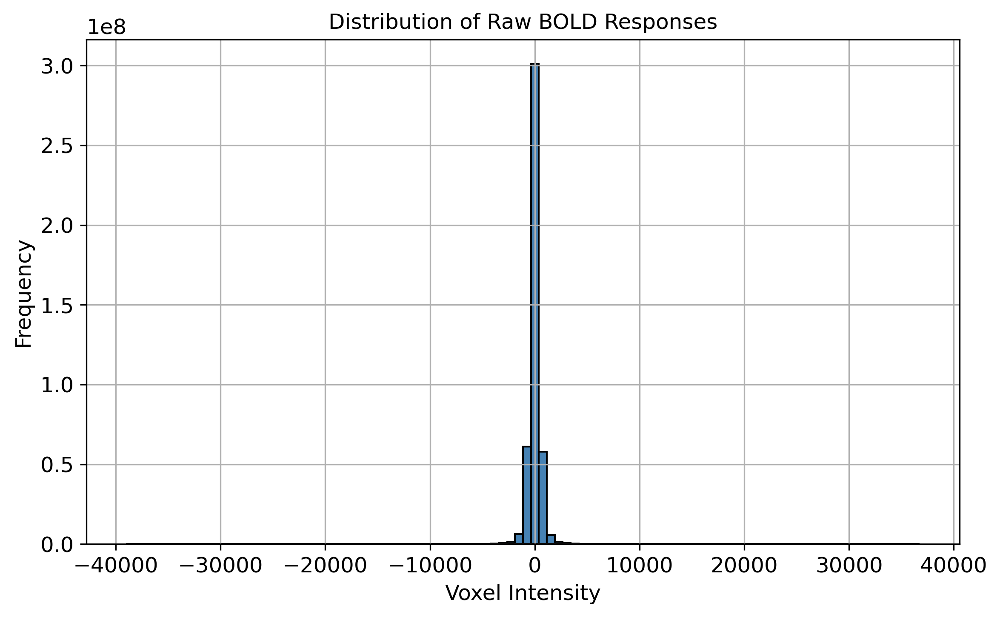

In [42]:
sample = voxels.ravel()

plt.figure(figsize=(8,5))

plt.hist(
    sample,
    bins=100,
    color="steelblue",
    edgecolor="black"
)

plt.xlabel("Voxel Intensity")

plt.ylabel("Frequency")

plt.title("Distribution of Raw BOLD Responses")

plt.grid(True)

plt.tight_layout()

plt.savefig(
    "outputs/Figure_RawBOLD_Histogram.png",
    dpi=300
)

plt.show()

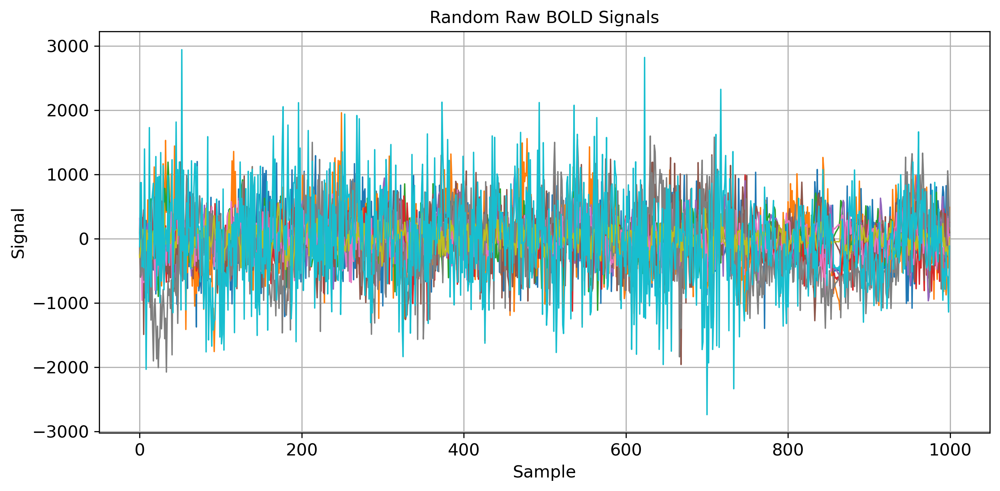

In [43]:
np.random.seed(42)

ids = np.random.choice(
    num_voxels,
    10,
    replace=False
)

plt.figure(figsize=(10,5))

for i in ids:

    plt.plot(
        voxels[:1000,i],
        linewidth=1
    )

plt.xlabel("Sample")

plt.ylabel("Signal")

plt.title("Random Raw BOLD Signals")

plt.grid(True)

plt.tight_layout()

plt.savefig(
    "outputs/Figure_RandomVoxelSignals.png",
    dpi=300
)

plt.show()

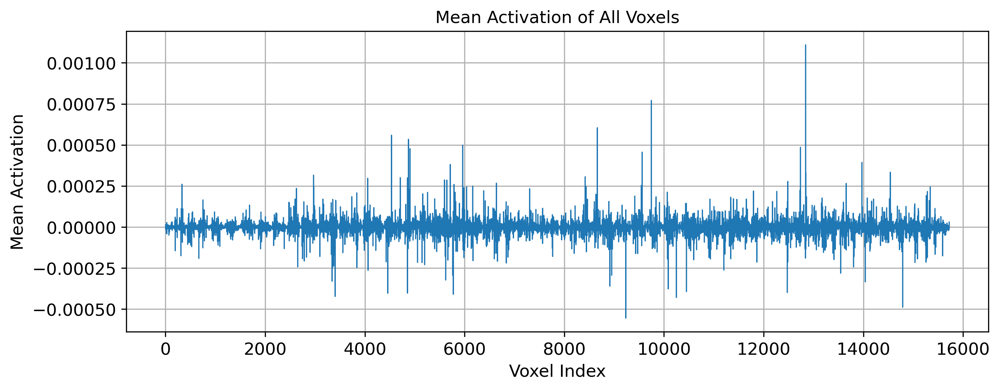

In [44]:
mean_activation = np.mean(
    voxels,
    axis=0
)

plt.figure(figsize=(10,4))

plt.plot(
    mean_activation,
    linewidth=0.8
)

plt.xlabel("Voxel Index")

plt.ylabel("Mean Activation")

plt.title("Mean Activation of All Voxels")

plt.grid(True)

plt.tight_layout()

plt.savefig(
    "outputs/Figure_MeanActivation.png",
    dpi=300
)

plt.show()

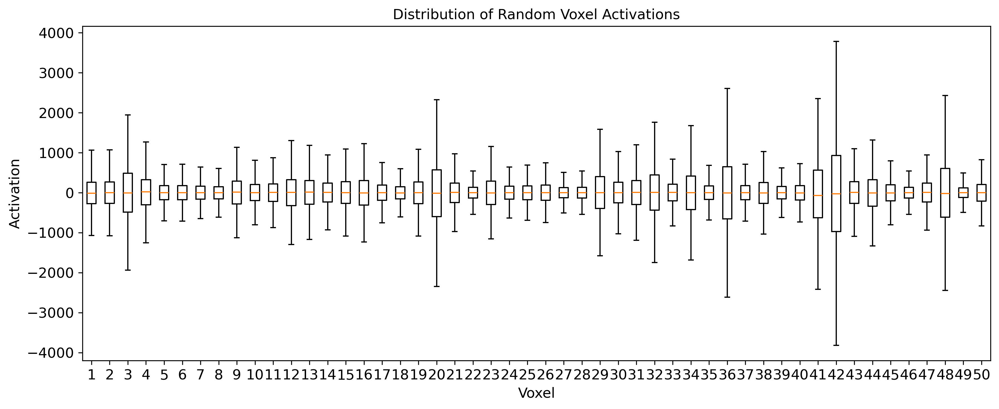

In [45]:
sample = voxels[:,np.random.choice(num_voxels,50)]

plt.figure(figsize=(12,5))

plt.boxplot(
    sample,
    showfliers=False
)

plt.xlabel("Voxel")

plt.ylabel("Activation")

plt.title("Distribution of Random Voxel Activations")

plt.tight_layout()

plt.savefig(
    "outputs/Figure_Boxplot.png",
    dpi=300
)

plt.show()

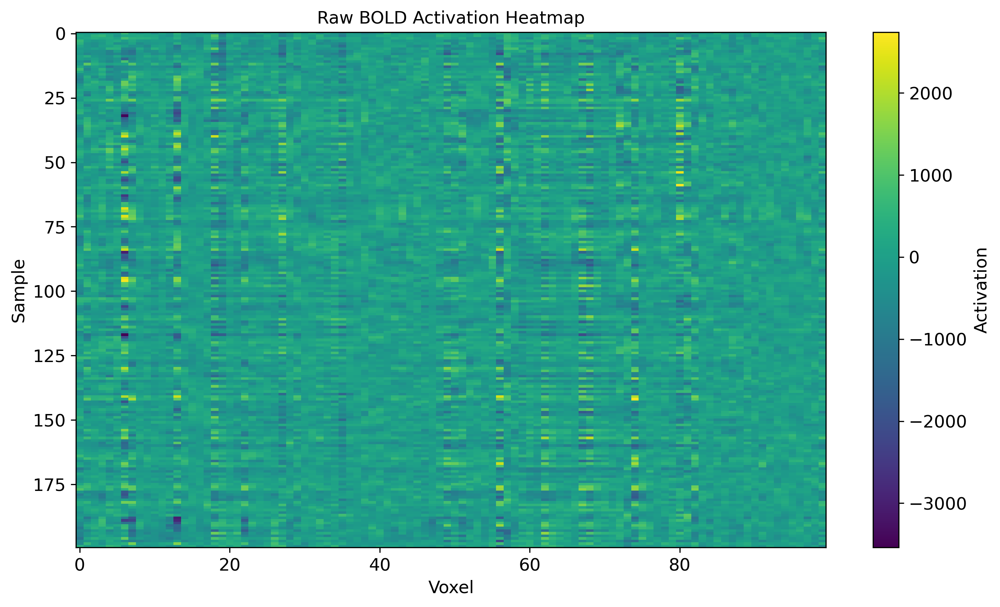

In [46]:
subset = voxels[:200,:100]

plt.figure(figsize=(10,6))

plt.imshow(
    subset,
    aspect="auto",
    cmap="viridis"
)

plt.colorbar(label="Activation")

plt.xlabel("Voxel")

plt.ylabel("Sample")

plt.title("Raw BOLD Activation Heatmap")

plt.tight_layout()

plt.savefig(
    "outputs/Figure_RawHeatmap.png",
    dpi=300
)

plt.show()

In [47]:
missing = {

    "NaN": np.isnan(voxels).sum(),

    "Inf": np.isinf(voxels).sum(),

    "Zero": np.sum(voxels==0)

}

missing_df = pd.DataFrame(
    missing.items(),
    columns=["Metric","Count"]
)

missing_df

,Metric,Count
0,NaN,0
1,Inf,0
2,Zero,736


In [2]:
import os
import h5py
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler

plt.rcParams["figure.dpi"] = 300
plt.rcParams["font.size"] = 12

OUTPUT_DIR = "outputs"
os.makedirs(OUTPUT_DIR, exist_ok=True)

In [3]:
DATA_PATH = r"D:\NSD dataset\subj01_nsdgeneral.hdf5"

with h5py.File(DATA_PATH, "r") as f:
    voxels = f["voxels"][:]

print("Voxel Shape:", voxels.shape)

Voxel Shape: (27750, 15724)


In [4]:
raw_stats = {
    "Minimum": np.min(voxels),
    "Maximum": np.max(voxels),
    "Mean": np.mean(voxels),
    "Median": np.median(voxels),
    "Standard Deviation": np.std(voxels),
    "Variance": np.var(voxels)
}

raw_df = pd.DataFrame(raw_stats.items(),
                      columns=["Metric","Raw Value"])

raw_df

,Metric,Raw Value
0,Minimum,-39010.417969
1,Maximum,36753.457031
2,Mean,0.000001
3,Median,1.260000
4,Standard Deviation,536.560852
5,Variance,287897.531250


In [6]:
scaler = StandardScaler()

voxels_norm = scaler.fit_transform(voxels)

print(voxels_norm.shape)

(27750, 15724)


In [7]:
norm_stats = {
    "Minimum": np.min(voxels_norm),
    "Maximum": np.max(voxels_norm),
    "Mean": np.mean(voxels_norm),
    "Median": np.median(voxels_norm),
    "Standard Deviation": np.std(voxels_norm),
    "Variance": np.var(voxels_norm)
}

norm_df = pd.DataFrame(norm_stats.items(),
                       columns=["Metric","Normalized Value"])

norm_df

,Metric,Normalized Value
0,Minimum,-1.872696e+01
1,Maximum,1.727180e+01
2,Mean,3.151485e-10
3,Median,3.566958e-03
4,Standard Deviation,1.000002e+00
5,Variance,1.000005e+00


In [8]:
comparison = pd.DataFrame({
    "Metric": raw_df["Metric"],
    "Raw": raw_df["Raw Value"],
    "Normalized": norm_df["Normalized Value"]
})

comparison

,Metric,Raw,Normalized
0,Minimum,-39010.417969,-1.872696e+01
1,Maximum,36753.457031,1.727180e+01
2,Mean,0.000001,3.151485e-10
3,Median,1.260000,3.566958e-03
4,Standard Deviation,536.560852,1.000002e+00
5,Variance,287897.531250,1.000005e+00


In [9]:
comparison.to_csv(
    os.path.join(
        OUTPUT_DIR,
        "Raw_vs_Normalized_Statistics.csv"
    ),
    index=False
)

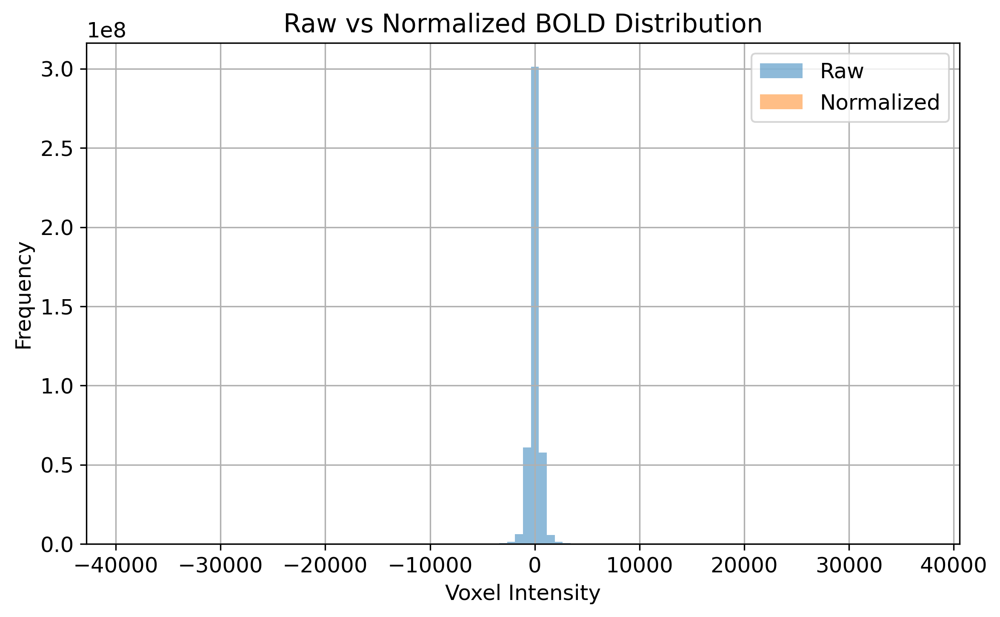

In [10]:
plt.figure(figsize=(8,5))

plt.hist(
    voxels.ravel(),
    bins=100,
    alpha=0.5,
    label="Raw"
)

plt.hist(
    voxels_norm.ravel(),
    bins=100,
    alpha=0.5,
    label="Normalized"
)

plt.xlabel("Voxel Intensity")

plt.ylabel("Frequency")

plt.title("Raw vs Normalized BOLD Distribution")

plt.legend()

plt.grid(True)

plt.tight_layout()

plt.savefig(
    os.path.join(
        OUTPUT_DIR,
        "Raw_vs_Normalized_Histogram.png"
    ),
    dpi=300
)

plt.show()

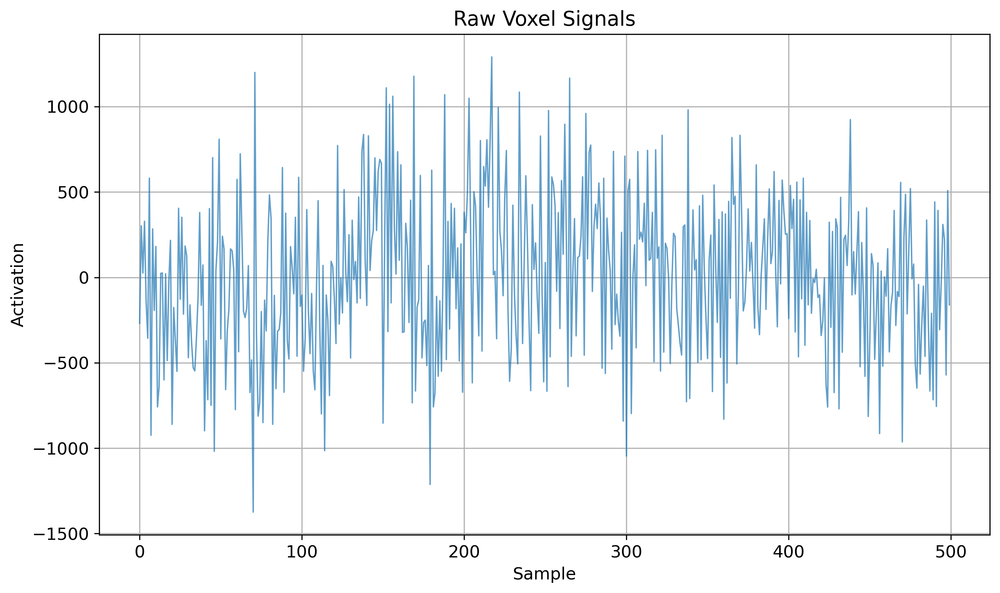

In [11]:
np.random.seed(42)

voxel_ids = np.random.choice(
    voxels.shape[1],
    1,
    replace=False
)

plt.figure(figsize=(10,6))

for i in voxel_ids:

    plt.plot(
        voxels[:500,i],
        linewidth=1,
        alpha=0.7
    )

plt.title("Raw Voxel Signals")

plt.xlabel("Sample")

plt.ylabel("Activation")

plt.grid(True)

plt.tight_layout()

plt.savefig(
    os.path.join(
        OUTPUT_DIR,
        "RawSignals.png"
    ),
    dpi=300
)

plt.show()

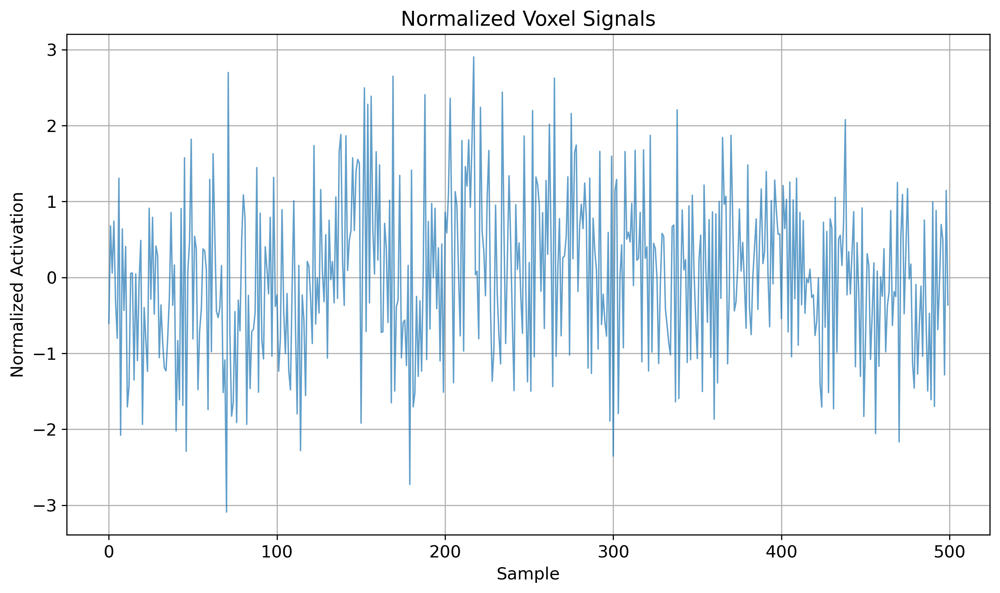

In [12]:
plt.figure(figsize=(10,6))

for i in voxel_ids:

    plt.plot(
        voxels_norm[:500,i],
        linewidth=1,
        alpha=0.7
    )

plt.title("Normalized Voxel Signals")

plt.xlabel("Sample")

plt.ylabel("Normalized Activation")

plt.grid(True)

plt.tight_layout()

plt.savefig(
    os.path.join(
        OUTPUT_DIR,
        "NormalizedSignals.png"
    ),
    dpi=300
)

plt.show()

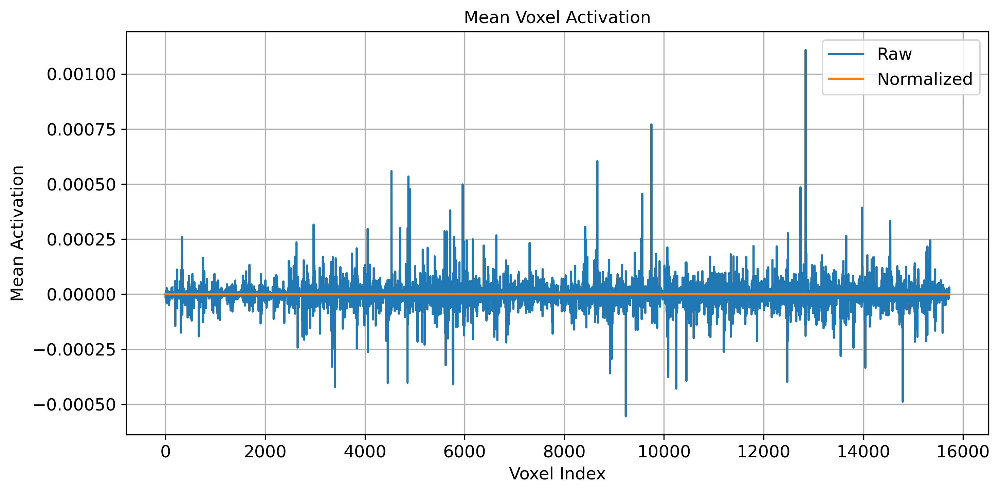

In [58]:
raw_mean = np.mean(
    voxels,
    axis=0
)

norm_mean = np.mean(
    voxels_norm,
    axis=0
)

plt.figure(figsize=(10,5))

plt.plot(
    raw_mean,
    label="Raw"
)

plt.plot(
    norm_mean,
    label="Normalized"
)

plt.xlabel("Voxel Index")

plt.ylabel("Mean Activation")

plt.title("Mean Voxel Activation")

plt.legend()

plt.grid(True)

plt.tight_layout()

plt.savefig(
    os.path.join(
        OUTPUT_DIR,
        "MeanActivationComparison.png"
    ),
    dpi=300
)

plt.show()

C:\Users\HP\AppData\Local\Temp\ipykernel_6288\2515707810.py:9: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(


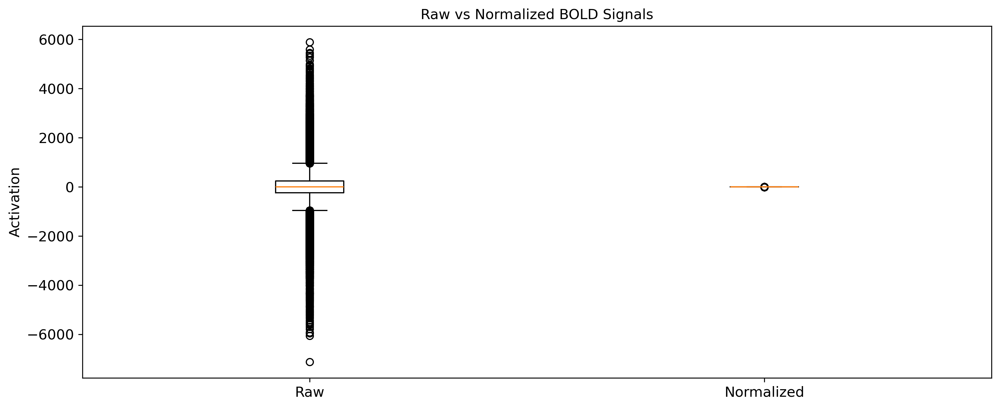

In [59]:
sample_voxels = np.random.choice(
    voxels.shape[1],
    30,
    replace=False
)

plt.figure(figsize=(12,5))

plt.boxplot(
    [
        voxels[:,sample_voxels].flatten(),
        voxels_norm[:,sample_voxels].flatten()
    ],
    labels=[
        "Raw",
        "Normalized"
    ]
)

plt.ylabel("Activation")

plt.title("Raw vs Normalized BOLD Signals")

plt.tight_layout()

plt.savefig(
    os.path.join(
        OUTPUT_DIR,
        "Raw_vs_Normalized_Boxplot.png"
    ),
    dpi=300
)

plt.show()

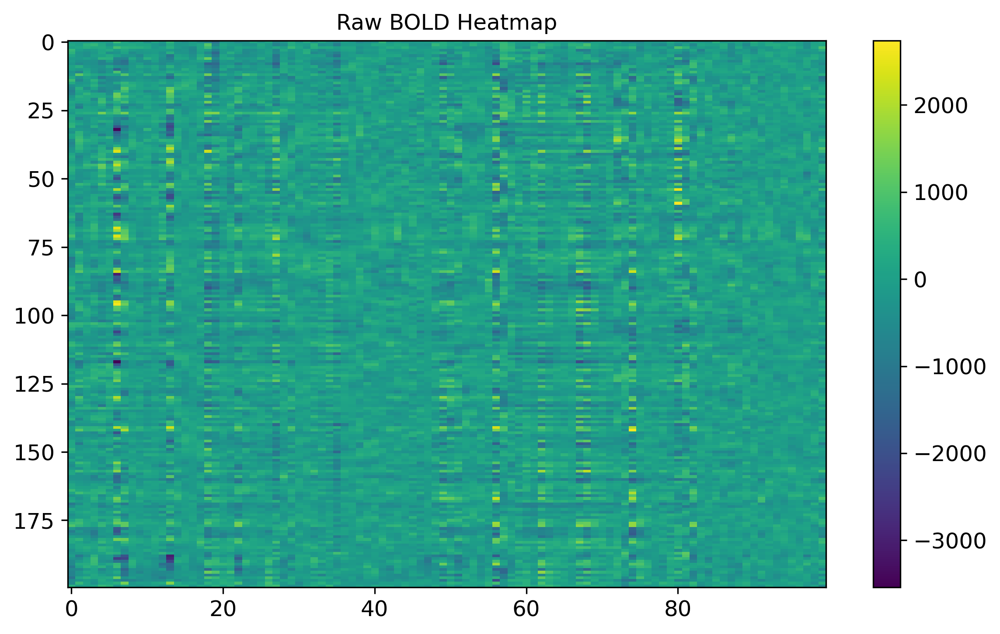

In [60]:
subset = slice(0,200)
vox_subset = slice(0,100)

plt.figure(figsize=(8,5))

plt.imshow(
    voxels[subset,vox_subset],
    aspect="auto",
    cmap="viridis"
)

plt.colorbar()

plt.title("Raw BOLD Heatmap")

plt.tight_layout()

plt.savefig(
    os.path.join(
        OUTPUT_DIR,
        "RawHeatmap.png"
    ),
    dpi=300
)

plt.show()

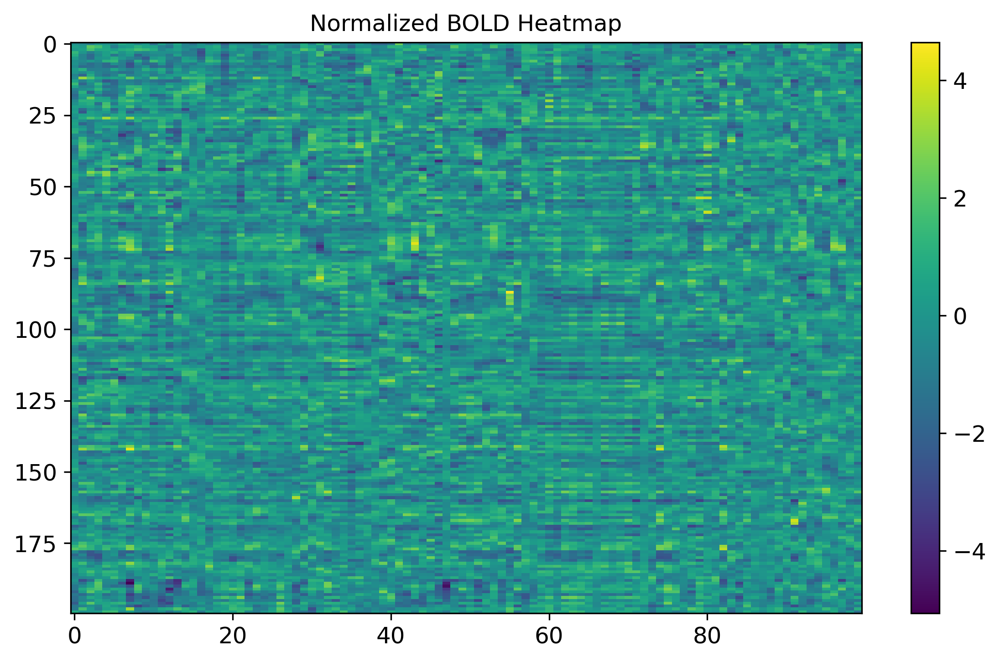

In [61]:
plt.figure(figsize=(8,5))

plt.imshow(
    voxels_norm[subset,vox_subset],
    aspect="auto",
    cmap="viridis"
)

plt.colorbar()

plt.title("Normalized BOLD Heatmap")

plt.tight_layout()

plt.savefig(
    os.path.join(
        OUTPUT_DIR,
        "NormalizedHeatmap.png"
    ),
    dpi=300
)

plt.show()

In [63]:
import h5py
import numpy as np
import matplotlib.pyplot as plt

from scipy.signal import detrend
from scipy.ndimage import gaussian_filter1d
from sklearn.preprocessing import StandardScaler

# --------------------------------------------------
# Load Voxels
# --------------------------------------------------

DATA_PATH = r"D:\NSD dataset\subj01_nsdgeneral.hdf5"

with h5py.File(DATA_PATH,"r") as f:
    voxels = f["voxels"][:]

print(voxels.shape)

# --------------------------------------------------
# Step 1
# Raw Signal
# --------------------------------------------------

raw = voxels.copy()

# --------------------------------------------------
# Step 2
# Remove Linear Drift
# --------------------------------------------------

detrended = detrend(
    raw,
    axis=0,
    type="linear"
)

# --------------------------------------------------
# Step 3
# Temporal Gaussian Smoothing
# --------------------------------------------------

smoothed = gaussian_filter1d(
    detrended,
    sigma=1,
    axis=0
)

# --------------------------------------------------
# Step 4
# Standardization
# --------------------------------------------------

scaler = StandardScaler()

processed = scaler.fit_transform(smoothed)

print(processed.shape)

(27750, 15724)
(27750, 15724)


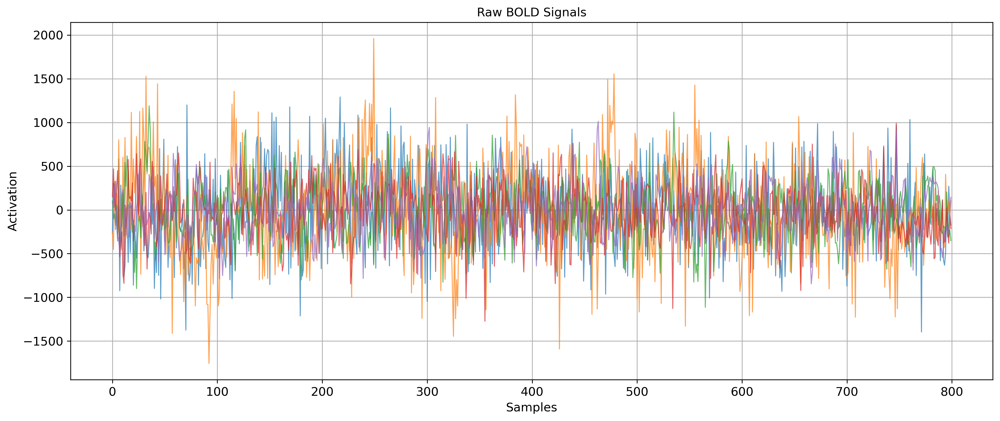

In [64]:
np.random.seed(42)

voxels_to_plot = np.random.choice(
    raw.shape[1],
    5,
    replace=False
)

plt.figure(figsize=(14,6))

for v in voxels_to_plot:

    plt.plot(
        raw[:800,v],
        alpha=0.7,
        linewidth=1
    )

plt.title("Raw BOLD Signals")

plt.xlabel("Samples")

plt.ylabel("Activation")

plt.grid(True)

plt.tight_layout()

plt.show()

In [ ]:
plt.figure(figsize=(14,6))

for v in voxels_to_plot:

    plt.plot(
        processed[:800,v],
        alpha=0.7,
        linewidth=1
    )

plt.title("Preprocessed BOLD Signals")

plt.xlabel("Samples")

plt.ylabel("Normalized Activation")

plt.grid(True)

plt.tight_layout()

plt.show()

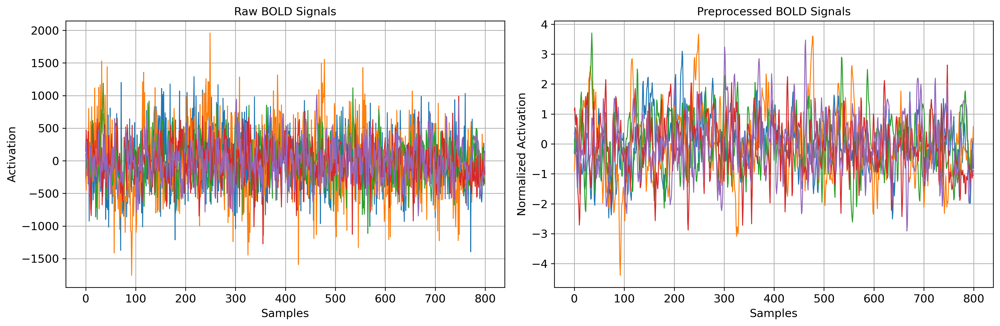

In [65]:
fig,ax=plt.subplots(
    1,
    2,
    figsize=(15,5)
)

for v in voxels_to_plot:

    ax[0].plot(
        raw[:800,v],
        linewidth=1
    )

ax[0].set_title("Raw BOLD Signals")

ax[0].set_xlabel("Samples")

ax[0].set_ylabel("Activation")

ax[0].grid(True)

for v in voxels_to_plot:

    ax[1].plot(
        processed[:800,v],
        linewidth=1
    )

ax[1].set_title("Preprocessed BOLD Signals")

ax[1].set_xlabel("Samples")

ax[1].set_ylabel("Normalized Activation")

ax[1].grid(True)

plt.tight_layout()

plt.show()

In [5]:
import os
import h5py

DATA_DIR = r"D:\NSD dataset"

subjects = [1,2,5,7]

for s in subjects:

    file = os.path.join(DATA_DIR,f"subj{s:02d}_nsdgeneral.hdf5")

    print("="*60)
    print(file)

    print("Exists :",os.path.exists(file))

    if os.path.exists(file):

        print("Size (GB):",round(os.path.getsize(file)/1024**3,2))

        try:

            with h5py.File(file,'r') as f:

                print("Opened Successfully")

                print(list(f.keys()))

        except Exception as e:

            print("ERROR :",e)

D:\NSD dataset\subj01_nsdgeneral.hdf5
Exists : True
Size (GB): 7.57
Opened Successfully
['images', 'voxels']
D:\NSD dataset\subj02_nsdgeneral.hdf5
Exists : True
Size (GB): 7.46
Opened Successfully
['images', 'voxels']
D:\NSD dataset\subj05_nsdgeneral.hdf5
Exists : True
Size (GB): 7.32
ERROR : Unable to synchronously open file (bad object header version number)
D:\NSD dataset\subj07_nsdgeneral.hdf5
Exists : True
Size (GB): 7.27
ERROR : Unable to synchronously open file (bad object header version number)


In [6]:
import h5py
import numpy as np

print("h5py:", h5py.__version__)
print("HDF5:", h5py.version.hdf5_version)
print("NumPy:", np.__version__)

h5py: 3.16.0
HDF5: 2.0.0
NumPy: 1.26.4


In [7]:
import h5py

try:
    f = h5py.File(r"D:\NSD dataset\subj05_nsdgeneral.hdf5", "r")
    print("Opened")
    print(list(f.keys()))
    f.close()
except Exception as e:
    print(e)

Unable to synchronously open file (bad object header version number)


In [ ]:
import os
import h5py

files = [
    r"D:\NSD dataset\subj05_nsdgeneral.hdf5",
    r"D:\NSD dataset\subj07_nsdgeneral.hdf5"
]

for file in files:
    print("=" * 60)
    print(file)

    with open(file, "rb") as f:
        header = f.read(16)

    print("Header bytes:", header)
    try:
        with h5py.File(file, "r") as f:
            print("Opened successfully")
            print(list(f.keys()))
    except Exception as e:
        print("ERROR:", type(e).__name__, e)

SyntaxError: expected ':' (451340626.py, line 3)